# Regressão Linear Múltipla

O objetivo deste notebook é explorar a regressão múltipla e engenharia de atributos com as funções da API Scikit-learn.

Neste notebook você irá manipular dados de transações imobiliárias de King County para prever preços usando regressão múltipla. Desta forma, você poderá:
* Usar Pandas DataFrames para realizar algumas atividades de engenharia de atributos
* Usar funções do Scikit-learn para computar os coeficientes de regressão (pesos/parâmetros)
* Dados os coeficientes de regressão, os preditores e a saída (preços), criar uma função para computar erro utilizando a técnica de mínimos quadrados (Residual Sum of Squares).
* Visualizar os coeficientes e interpretar seus significados

## Importação das bibliotecas

Importação de bibliotecas necessárias para a execução dos comandos:
* Pandas: para manipulação dos dados
* Numpy: para compatibilizar o uso de dados por algumas funções
* Datetime: para formatar um dos atributos da base de dados
* Sklearn: para uso comparativo de funções de regressão linear

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas import DataFrame
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import RobustScaler, StandardScaler, LabelEncoder, MinMaxScaler, MaxAbsScaler, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
import xgboost as xgb
from catboost import CatBoostRegressor
from numpy import mean
from numpy import std

In [2]:
import warnings
warnings.filterwarnings('ignore')

# Leitura dos dados

O dataset contém dados de transações imobiliárias de King County, região aonde está a cidade de Seattle, USA.

## Dicionário de variáveis

![dicionario](https://miro.medium.com/v2/resize:fit:640/format:webp/1*aBClHGo8tIhVFrnpKN3-dw.jpeg)

In [3]:
df = pd.read_csv("kc_house_data.csv")
sales = df.copy()

## Análise Exploratória dos Dados - Exploratory Data Analysis (EDA) e Pré-processamento

Antes de criarmos o modelo de regressão, vamos primeiro explorar os dados:
* Por meio do uso de algumas funções nativas do Pandas (**.info()** e **.describe()**) é possível extrair uma visão geral dos atributos do dataset;
    * A função *info()* retorna informações específicas sobre os tipos de dados de cada um dos atributos, além de informações sobre uso de memória pela estrutura do mesmo;
    * A função *describe()* retorna informações estatísticas em geral referentes aos dados de cada atributo.

In [4]:
sales.drop(['id'],axis=1,inplace=True)
sales.drop(['date'],axis=1,inplace=True)

In [5]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21613 non-null  float64
 1   bedrooms       21613 non-null  int64  
 2   bathrooms      21613 non-null  float64
 3   sqft_living    21613 non-null  int64  
 4   sqft_lot       21613 non-null  int64  
 5   floors         21613 non-null  float64
 6   waterfront     21613 non-null  int64  
 7   view           21613 non-null  int64  
 8   condition      21613 non-null  int64  
 9   grade          21613 non-null  int64  
 10  sqft_above     21613 non-null  int64  
 11  sqft_basement  21613 non-null  int64  
 12  yr_built       21613 non-null  int64  
 13  yr_renovated   21613 non-null  int64  
 14  zipcode        21613 non-null  int64  
 15  lat            21613 non-null  float64
 16  long           21613 non-null  float64
 17  sqft_living15  21613 non-null  int64  
 18  sqft_l

In [6]:
sales.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [7]:
sales.nunique()

price            4028
bedrooms           13
bathrooms          30
sqft_living      1038
sqft_lot         9782
floors              6
waterfront          2
view                5
condition           5
grade              12
sqft_above        946
sqft_basement     306
yr_built          116
yr_renovated       70
zipcode            70
lat              5034
long              752
sqft_living15     777
sqft_lot15       8689
dtype: int64

In [8]:
colunas = sales.columns.values
colunas

array(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat',
       'long', 'sqft_living15', 'sqft_lot15'], dtype=object)

Separando as variáveis:

* Quantitativas:

'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot','floors', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15', 'sqft_lot15'

* Qualitativas:

'waterfront', 'view', 'condition', 'grade'

* Localização:

'zipcode', 'lat', 'long'

In [9]:
colunas_quant = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot','floors', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15', 'sqft_lot15']

colunas_quali = ['waterfront', 'view', 'condition', 'grade']

colunas_loc = ['zipcode', 'lat', 'long']

key_colunas = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot','floors', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15', 'sqft_lot15', 'waterfront', 'view', 'condition', 'grade', 'zipcode', 'lat', 'long']

In [10]:
sales.replace(
            {'bedrooms' :33},
            int(sales[sales['price']==640000]['bedrooms'].mean()),
            inplace=True
            )

Text(0.5, 0.92, 'Histograma das variáveis')

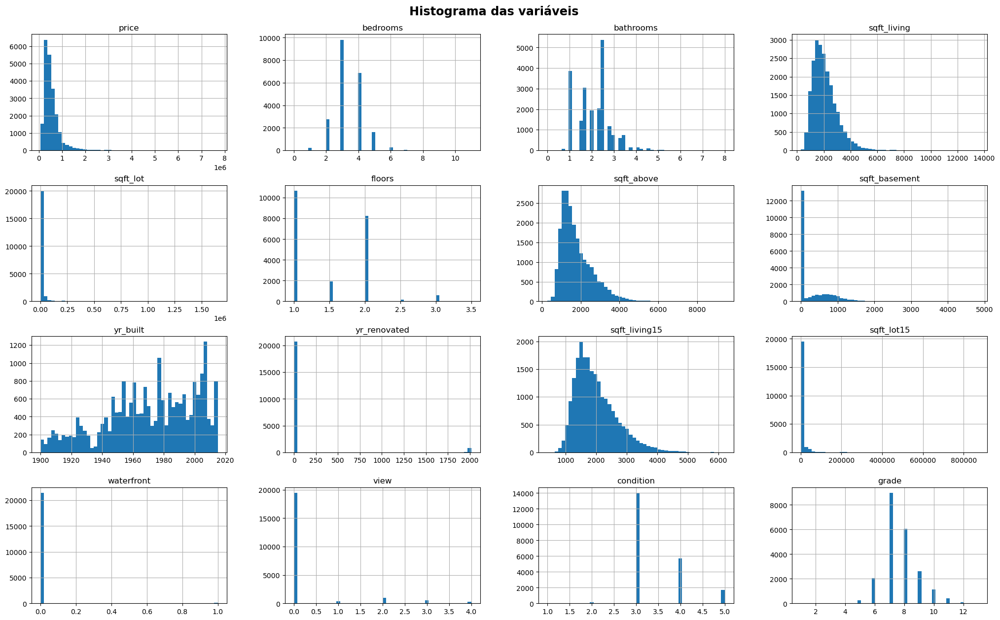

In [11]:
sales[colunas_quant+colunas_quali].hist(bins=50, figsize=(25,15))
plt.suptitle(
            'Histograma das variáveis',
            size='xx-large',
            weight='bold',
            y = .92
            )

Text(0.5, 0.92, 'Distribuição das variáveis')

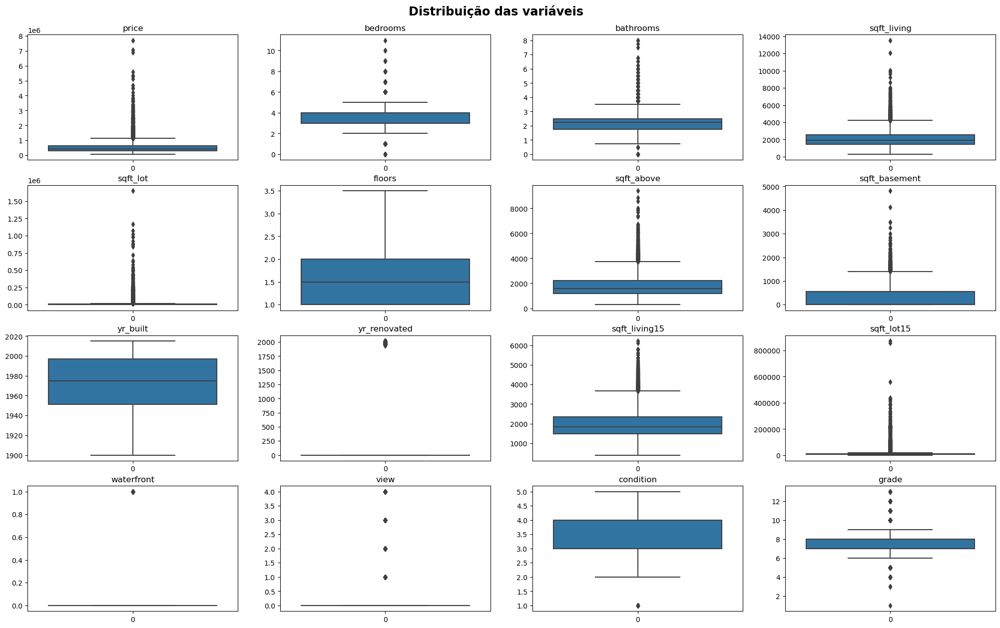

In [12]:
fig, ax = plt.subplots(4, 4, figsize=(25,15))
i=0
for col in colunas_quant+colunas_quali:
    sns.boxplot(sales[col], ax=ax[int(i/4),i%4])
    ax[int(i/4),i%4].set_title(col)
    i+=1

plt.suptitle(
            'Distribuição das variáveis',
            size='xx-large',
            weight='bold',
            y=0.92
            )

Text(0.5, 0.92, 'Relação das variáveis com o preço')

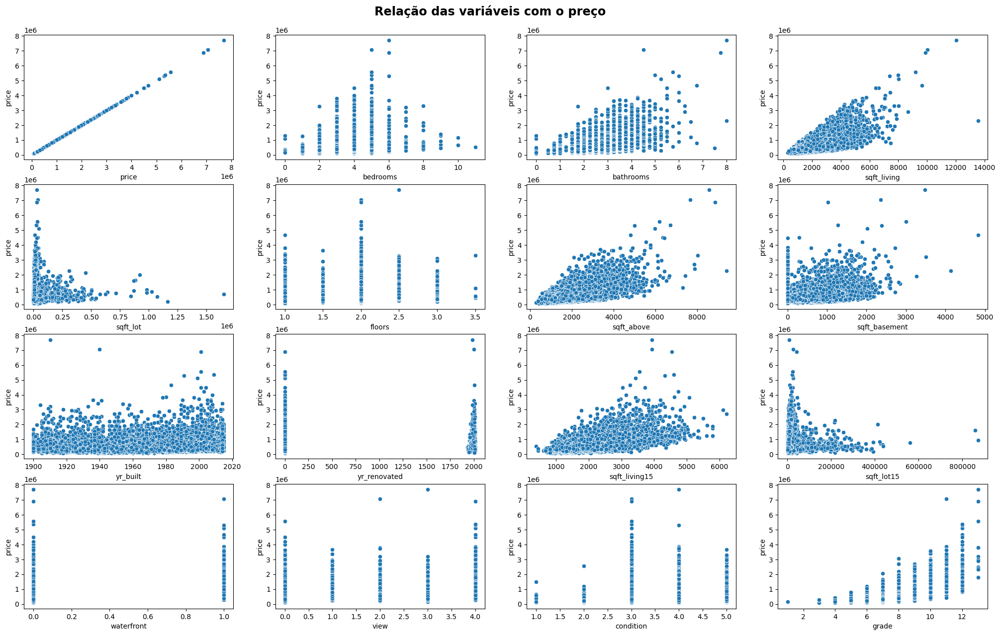

In [13]:
fig, ax = plt.subplots(4, 4, figsize=(25,15))
i=0
for col in colunas_quant+colunas_quali:
    sns.scatterplot(
                    sales,
                    x=sales[col],
                    y=sales['price'],
                    ax=ax[int(i/4),i%4]
                    )
    i+=1

plt.suptitle(
            'Relação das variáveis com o preço',
            size='xx-large',
            weight='bold',
            y=0.92
            )

Text(0.5, 0.92, 'Mapa de calor com a correlação entre as variáveis')

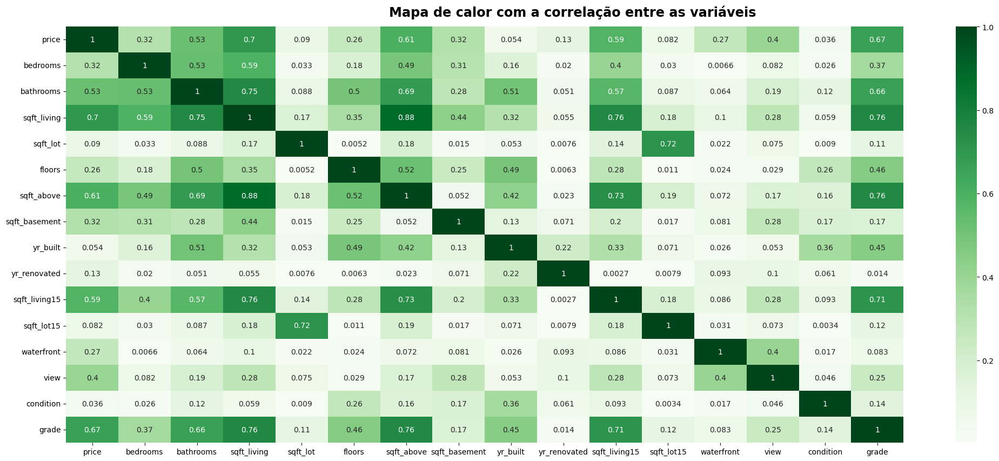

In [14]:
plt.figure(figsize=(25,10))
sns.heatmap(
            np.abs(sales[colunas_quant+colunas_quali].corr()),
            annot=True,
            cmap='Greens'
            )
plt.suptitle(
            'Mapa de calor com a correlação entre as variáveis',
            size='xx-large',
            weight='bold',
            y=0.92
            )

In [15]:
abs(sales[colunas_quant+colunas_quali].corr())>.6

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15,waterfront,view,condition,grade
price,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True
bedrooms,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bathrooms,False,False,True,True,False,False,True,False,False,False,False,False,False,False,False,True
sqft_living,True,False,True,True,False,False,True,False,False,False,True,False,False,False,False,True
sqft_lot,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False
floors,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
sqft_above,True,False,True,True,False,False,True,False,False,False,True,False,False,False,False,True
sqft_basement,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
yr_built,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False
yr_renovated,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False


Text(0.5, 0.92, 'Relação das variáveis com o preço e linha de regressão')

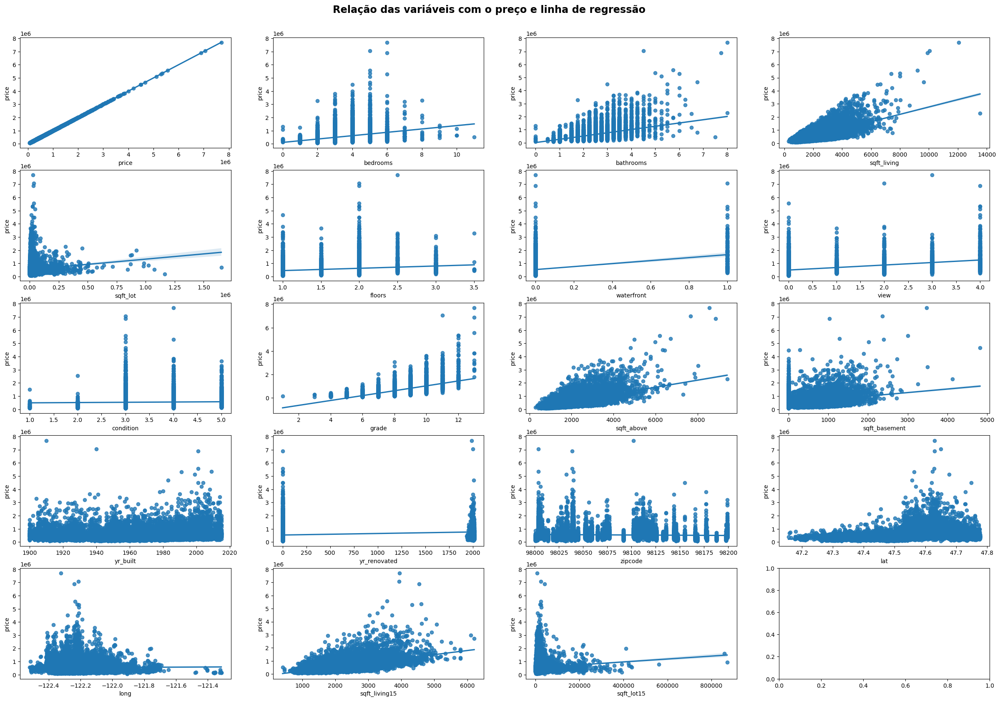

In [16]:
fig, ax = plt.subplots(np.ceil(len(colunas)/4).astype('int8'), 4, figsize=(30,20))
i=0
for col in colunas:
    sns.regplot(
                sales,
                x=sales[col],
                y=sales['price'],
                ax=ax[int(i/4),i%4]
                )
    i+=1

plt.suptitle(
            'Relação das variáveis com o preço e linha de regressão',
            size='xx-large',
            weight='bold',
            y=0.92
            )

Text(0.5, 0.92, 'Boxplot dos preços das casas por região postal')

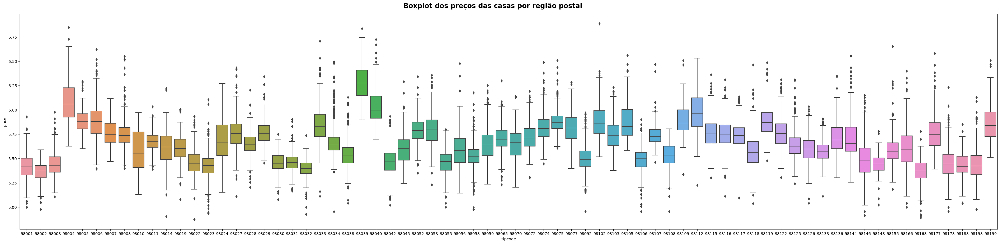

In [17]:
plt.figure(figsize=(45,10))
sns.boxplot(sales, x=sales['zipcode'], y=np.log10(sales['price']))
plt.suptitle(
            'Boxplot dos preços das casas por região postal',
            weight='bold',
            size='xx-large',
            y=.92
            )

Modificando as variáveis de coordenadas para o formato Ponto.

In [18]:
from shapely.geometry import Point

In [19]:
sales['coordinates'] = [
                        Point(xy)
                        for xy in zip(sales.long, sales.lat)
                        ]

In [20]:
sales.drop(['lat'],axis=1,inplace=True)
sales.drop(['long'],axis=1,inplace=True)

In [21]:
import geopandas as gpd


In [22]:
kingcounty = gpd.read_file('kingcounty/King_county_zip.shp')

In [23]:
kingcounty

,OBJECTID,ZIP,COUNTY,ZIP_TYPE,Shape_Leng,Shape_Area,geometry
0,1,98031,33.0,Standard,117508.231410,2.280129e+08,"POLYGON ((-122.21842 47.43750, -122.21935 47.4..."
1,2,98032,33.0,Standard,166737.665152,4.826754e+08,"MULTIPOLYGON (((-122.24187 47.44122, -122.2411..."
2,3,98033,33.0,Standard,101363.832386,2.566747e+08,"POLYGON ((-122.20571 47.65170, -122.20511 47.6..."
3,4,98034,33.0,Standard,98550.460072,2.725072e+08,"POLYGON ((-122.17551 47.73706, -122.17554 47.7..."
4,5,98030,33.0,Standard,94351.274949,2.000954e+08,"POLYGON ((-122.16746 47.38549, -122.16746 47.3..."
...,...,...,...,...,...,...,...
80,125,98288,33.0,PO Box,484750.182616,8.748980e+09,"POLYGON ((-121.11918 47.77994, -121.11918 47.7..."
81,128,98188,33.0,Standard,94574.310332,2.187023e+08,"POLYGON ((-122.24187 47.44122, -122.24363 47.4..."
82,129,98195,33.0,Standard,23454.900804,2.170139e+07,"POLYGON ((-122.29028 47.65501, -122.29032 47.6..."
83,138,98354,33.0,Standard,13089.520224,8.506824e+06,"POLYGON ((-122.31230 47.26090, -122.31385 47.2..."


In [24]:
zip_price = sales.groupby('zipcode')['price'].mean()
zip_price

zipcode
98001    2.808047e+05
98002    2.342840e+05
98003    2.941113e+05
98004    1.355927e+06
98005    8.101649e+05
             ...     
98177    6.761854e+05
98178    3.106128e+05
98188    2.890783e+05
98198    3.028789e+05
98199    7.918208e+05
Name: price, Length: 70, dtype: float64

In [30]:
zip_variables_mean = sales.groupby('zipcode')[colunas_quali+colunas_quant].mean()
zip_variables_mean

,waterfront,view,condition,grade,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
zipcode,,,,,,,,,,,,,,,,
98001,0.000000,0.102210,3.337017,7.295580,2.808047e+05,3.383978,2.006215,1900.856354,14937.450276,1.429558,1721.325967,179.530387,1980.679558,43.801105,1828.856354,11214.403315
98002,0.000000,0.010050,3.743719,6.693467,2.342840e+05,3.326633,1.839196,1627.743719,7517.633166,1.334171,1522.537688,105.206030,1967.773869,59.889447,1479.030151,7585.482412
98003,0.000000,0.214286,3.371429,7.542857,2.941113e+05,3.357143,2.047321,1928.882143,10603.096429,1.310714,1663.550000,265.332143,1976.885714,21.360714,1876.196429,9746.178571
98004,0.003155,0.305994,3.495268,8.687697,1.355927e+06,3.854890,2.527603,2909.022082,13104.220820,1.432177,2419.842271,489.179811,1971.470032,208.145110,2674.700315,12805.022082
98005,0.000000,0.095238,3.696429,8.488095,8.101649e+05,3.851190,2.424107,2656.803571,19928.785714,1.279762,2160.196429,496.607143,1969.744048,47.630952,2567.863095,18367.773810
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98177,0.003922,0.815686,3.494118,7.976471,6.761854e+05,3.396078,2.100000,2323.333333,11904.403922,1.276471,1836.713725,486.619608,1960.843137,172.145098,2186.196078,11690.239216
98178,0.034351,0.534351,3.320611,6.816794,3.106128e+05,3.305344,1.731870,1729.351145,8309.122137,1.185115,1325.992366,403.358779,1955.232824,84.057252,1648.816794,8149.641221
98188,0.000000,0.147059,3.330882,7.036765,2.890783e+05,3.433824,1.863971,1802.772059,10126.080882,1.227941,1492.154412,310.617647,1965.507353,43.794118,1636.279412,9752.801471


In [31]:
zip_variables_median = sales.groupby('zipcode')[colunas_quali+colunas_quant].median()
zip_variables_median

,waterfront,view,condition,grade,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
zipcode,,,,,,,,,,,,,,,,
98001,0.0,0.0,3.0,7.0,260000.0,3.0,2.000,1822.0,9287.0,1.0,1600.0,0.0,1981.0,0.0,1700.0,8948.5
98002,0.0,0.0,4.0,7.0,235000.0,3.0,1.750,1570.0,7282.0,1.0,1440.0,0.0,1966.0,0.0,1410.0,7316.0
98003,0.0,0.0,3.0,7.0,267475.0,3.0,2.000,1780.0,8816.0,1.0,1480.0,0.0,1975.0,0.0,1774.0,8589.5
98004,0.0,0.0,3.0,9.0,1150000.0,4.0,2.500,2660.0,11119.0,1.0,2130.0,0.0,1965.0,0.0,2540.0,11377.0
98005,0.0,0.0,4.0,8.0,765475.0,4.0,2.375,2505.0,12220.0,1.0,1960.0,305.0,1967.0,0.0,2435.0,11623.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98177,0.0,0.0,3.0,8.0,554000.0,3.0,2.000,2120.0,8210.0,1.0,1630.0,400.0,1956.0,0.0,2110.0,8258.0
98178,0.0,0.0,3.0,7.0,278277.0,3.0,1.750,1725.0,7200.0,1.0,1200.0,0.0,1952.0,0.0,1650.0,7200.0
98188,0.0,0.0,3.0,7.0,264000.0,3.0,1.750,1690.0,8913.0,1.0,1350.0,0.0,1959.5,0.0,1590.0,9371.5


In [32]:
kingcounty_prices_mean = pd.merge(
                                kingcounty,
                                zip_variables_mean,
                                how='inner',
                                left_on='ZIP',
                                right_on='zipcode'
                                )

In [33]:
kingcounty_prices_mean['log_prices'] = np.log10(kingcounty_prices_mean['price'])

In [34]:
kingcounty_prices_mean.explore(
                            column='price',
                            legend=True,
                            legend_kwds={'caption': 'Preços', 'max_labels':8},
                            tiles='CartoDB positron'
                            )

In [35]:
kingcounty_prices_mean.explore(
                            column='log_prices',
                            legend=True,
                            tiles='CartoDB positron'
                            )

In [36]:
kingcounty_prices_median = pd.merge(
                                    kingcounty,
                                    zip_variables_median,
                                    how='inner',
                                    left_on='ZIP',
                                    right_on='zipcode'
                                    )

In [37]:
kingcounty_prices_median['log_prices'] = np.log10(kingcounty_prices_median['price'])

In [38]:
kingcounty_prices_median.explore(
                                column='price',
                                legend=True,
                                legend_kwds={'caption': 'Preços', 'max_labels':8},
                                tiles='CartoDB positron'
                                )

In [39]:
kingcounty_prices_median.explore(
                                column='log_prices',
                                legend=True,
                                tiles='CartoDB positron'
                                )